#### Calibrate Camera

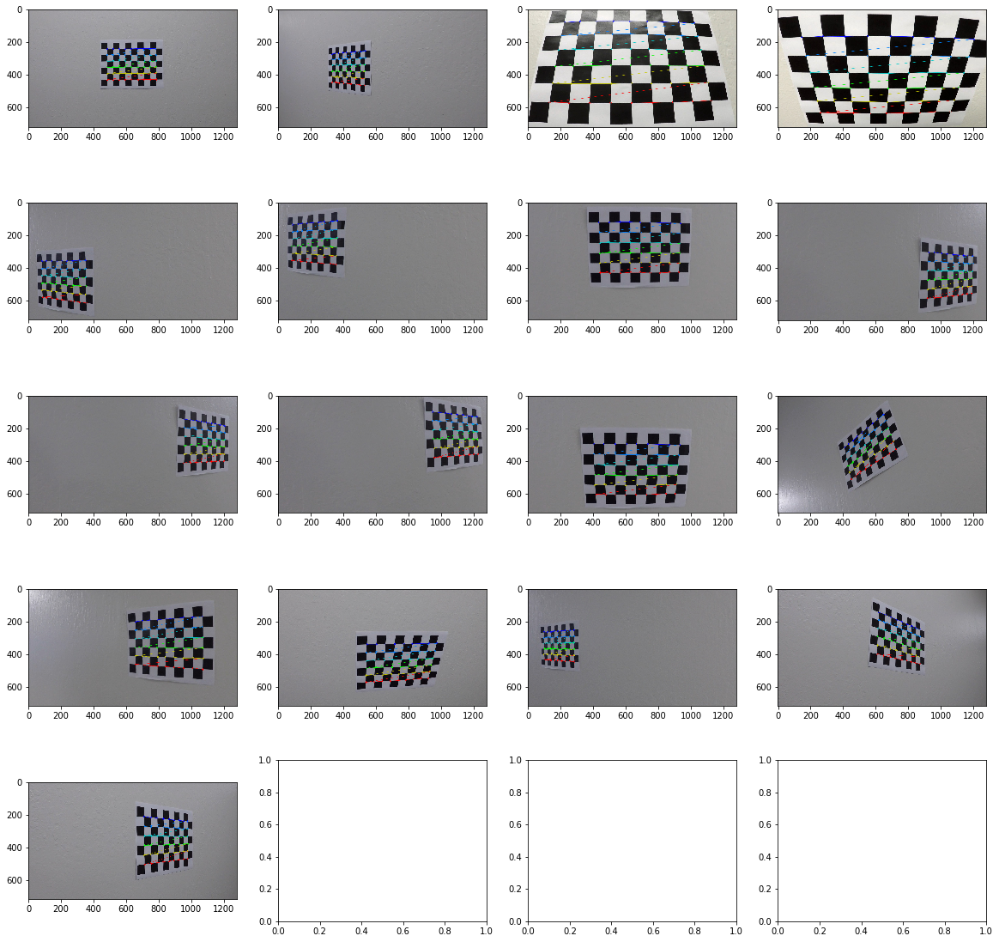

In [1]:
# camera calibration
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
%matplotlib inline

def display_images(images, nrows=5, ncols=4, figsize=(20,20)):
    f, axarr = plt.subplots(nrows, ncols, figsize=figsize)
    for idx, img in enumerate(images):
        # read in each image
        row = idx // ncols
        col = idx % ncols
        axarr[row, col].imshow(img)

# Read in and make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Arrays to store object points and image points from all the images

nx = 9
ny = 6

objpoints = []  # 3D points in real world space
imgpoints = []  # 2D points in image plane

# Prepare object points, like (0,0,0), (1,0,0), (2,0,0), ... , (7, 5, 0)
objp = np.zeros((ny*nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) # x, y coordinates

images_to_display = []

for idx, fname in enumerate(images):
    # read in each image
    img = mpimg.imread(fname)

    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
 
    # If corners are found, add object points, image points
    if ret is True:
        imgpoints.append(corners)
        objpoints.append(objp)
        # draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        images_to_display.append(img)

display_images(images_to_display)
    
# save calibration as pickle
dist_dict = {"objpoints": objpoints, "imgpoints" : imgpoints}
pickle.dump(dist_dict, open("dist_dict.p", "wb"))

In [2]:
# helper function to visualize transformation
def display_transform(img, transformed_img, figsize=(20, 10), transform_text='Transformed image'):
    '''
    Function to compare original images with transformed image
    '''
    
    # Visualize perspective transform
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    ax1.set_title('Original image')
    ax1.imshow(img)
    ax2.set_title(transform_text)
    ax2.imshow(transformed_img)

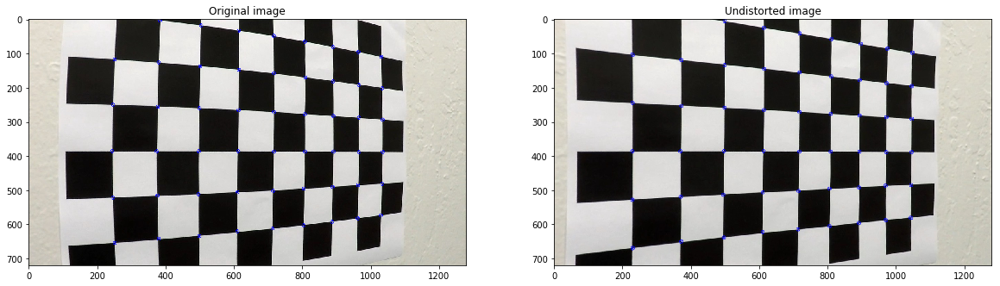

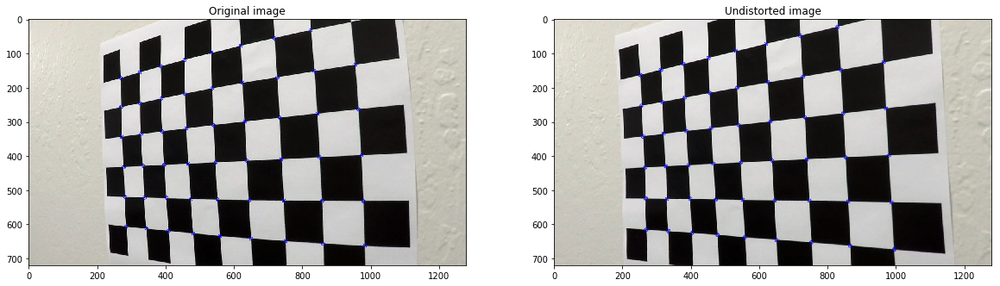

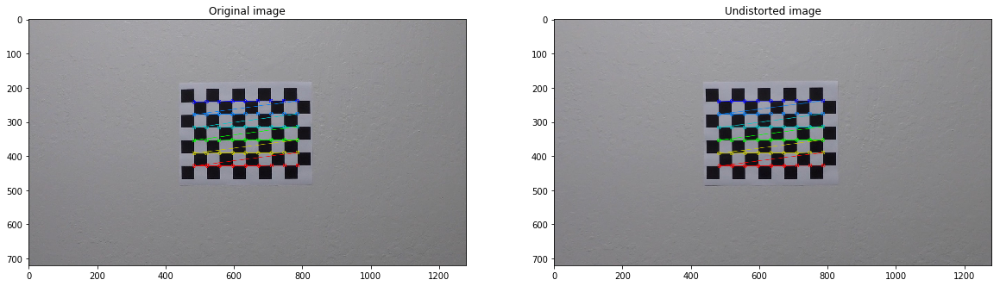

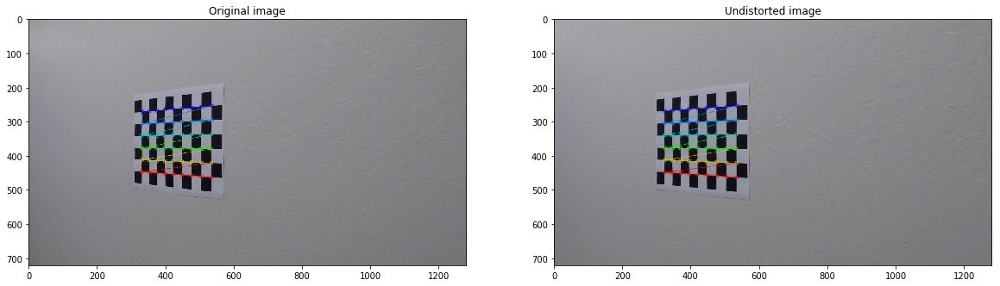

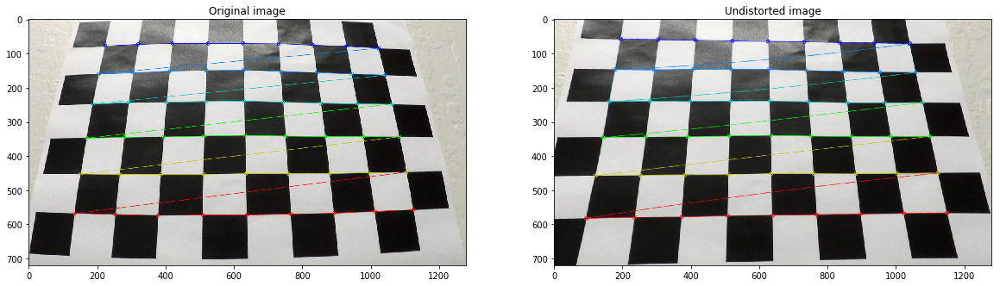

...

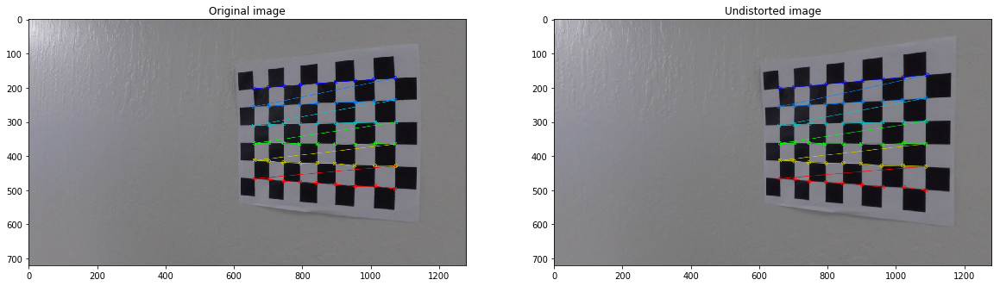

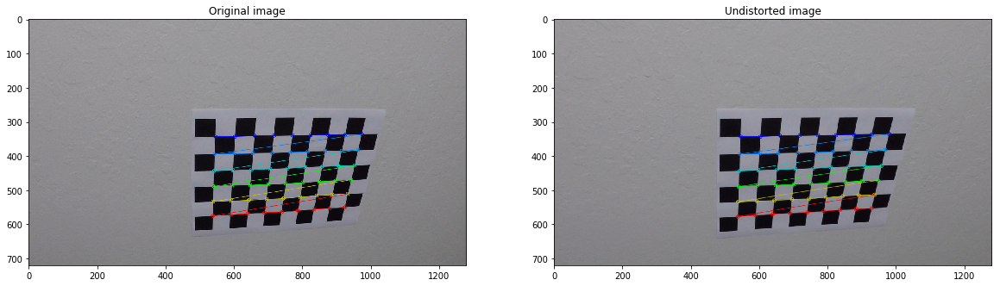

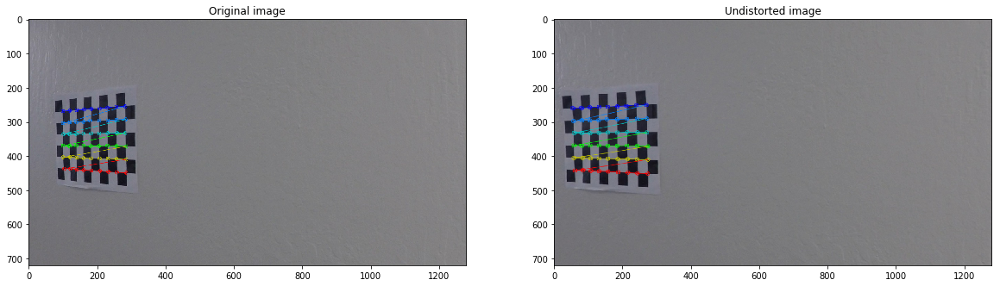

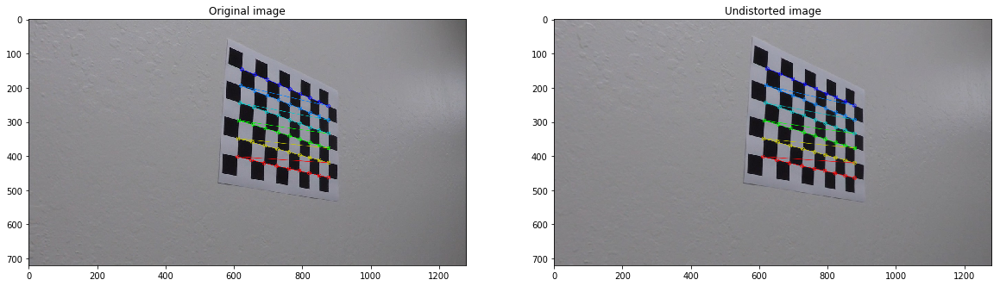

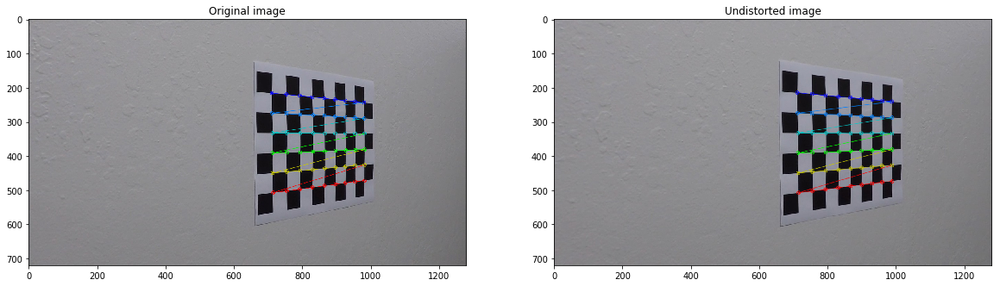

In [3]:
# visualize undistort on calibration images
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#Read in the saved objpoints and imgpoints
dist_pickle = pickle.load( open( "./dist_dict.p", "rb" ) )
objpoints = dist_pickle["objpoints"]
imgpoints = dist_pickle["imgpoints"]

# Read in and make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# TODO: Write a function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints=objpoints, imgpoints=imgpoints):
    ''' Function that takes an image, object points, and image points
        and performs camera calibration, image distortion correction and
        returns the undistorted image
    '''
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# Apply undistort to calibration images
for fname in images:
    img = mpimg.imread(fname)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    display_transform(img, undistorted, transform_text='Undistorted image')

#### Perspective Transform

(720, 1280, 3)


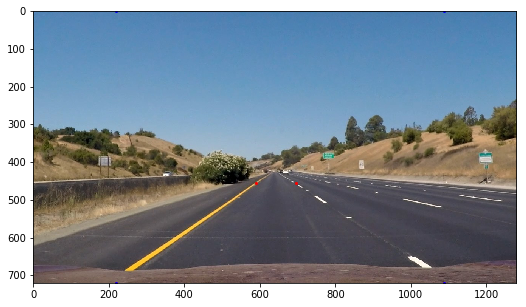

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
# source image points

# Read an image with straight lines to calibrate source and destination points
img = mpimg.imread('../test_images/straight_lines1.jpg')
print(img.shape)

src_pts = [[590, 455], [696, 455], [220, 719], [1088, 719]]
dst_pts = [[220, 0], [1088, 0], [220, 719], [1088, 719]]

plt.figure(figsize=(10,5))
plt.imshow(img)

# display source points in red
for pt in src_pts:
    plt.plot(pt[0], pt[1], 'o', markersize=2, color='r')
    
# display destination points in blue
for pt in dst_pts:
    plt.plot(pt[0], pt[1], 'o', markersize=2, color='b')

plt.show()

In [5]:
# Helper function to get warped_perspective M and inverse Minv
def get_warped_perspective(src_pts=src_pts, dst_pts=dst_pts):
    # Four source coordinate
    src = np.float32(src_pts)
    
    # Four desired coordinates
    dst = np.float32(dst_pts)
    
    # Compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Could compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

# Define perspective transform function
def warp(img, src_pts=src_pts, dst_pts=dst_pts):
    '''
    Takes image and transforms it to bird eye view
    '''
    # Define calibration box in source (original) and destination (desired or warped) coordinates
    
    img_size = (img.shape[1], img.shape[0])
    
    M, _ = get_warped_perspective(src_pts=src_pts, dst_pts=dst_pts)
    
    # Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped

def get_warped_perspective(src_pts=src_pts, dst_pts=dst_pts):
    # Four source coordinate
    src = np.float32(src_pts)
    
    # Four desired coordinates
    dst = np.float32(dst_pts)
    
    # Compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Could compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

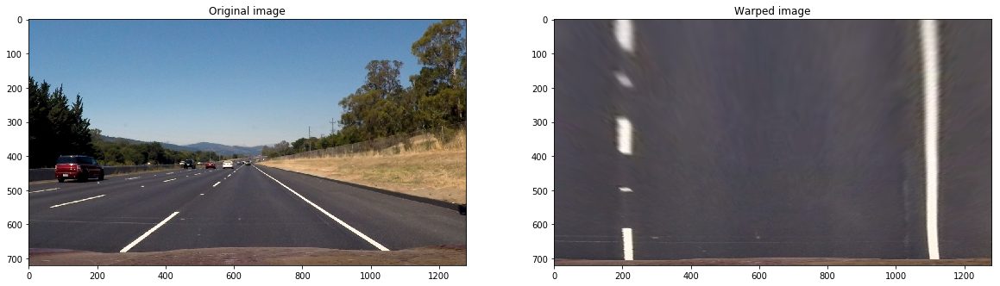

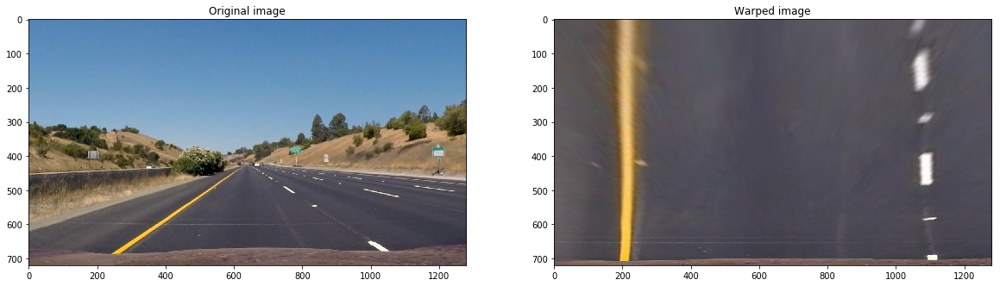

In [6]:
# Get perspective transform on straight line image
images = glob.glob('../test_images/straight_lines*.jpg')
for fname in images:
    img = mpimg.imread(fname)
    warped = warp(img)
    display_transform(img, warped, transform_text='Warped image')

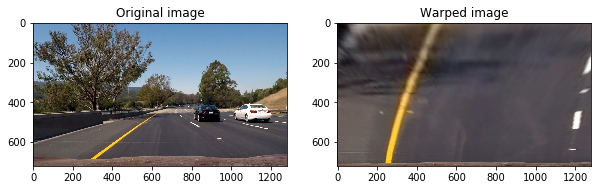

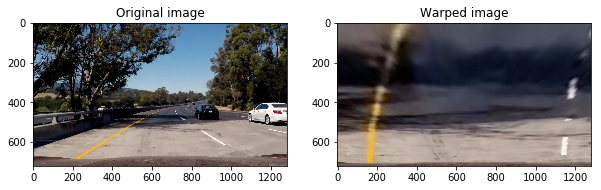

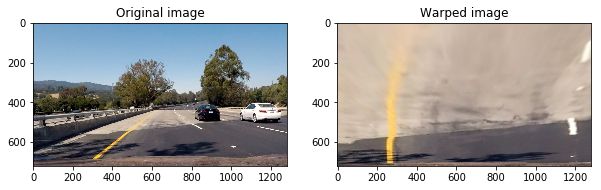

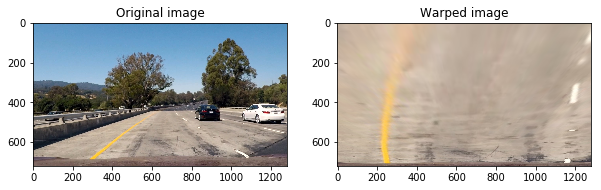

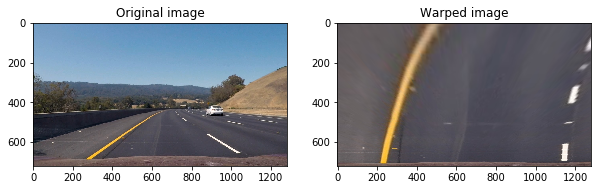

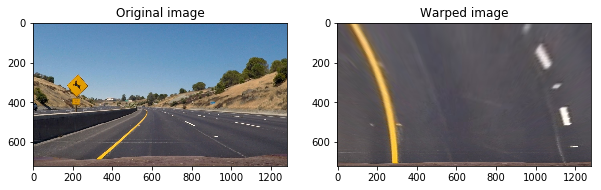

In [7]:
# Get perspective transform on all test images

# Read in and make a list of test images
images = glob.glob('../test_images/test*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    warped = warp(img)
    display_transform(img, warped, figsize=(10, 5), transform_text='Warped image')

#### Color and Gradient Thresholding

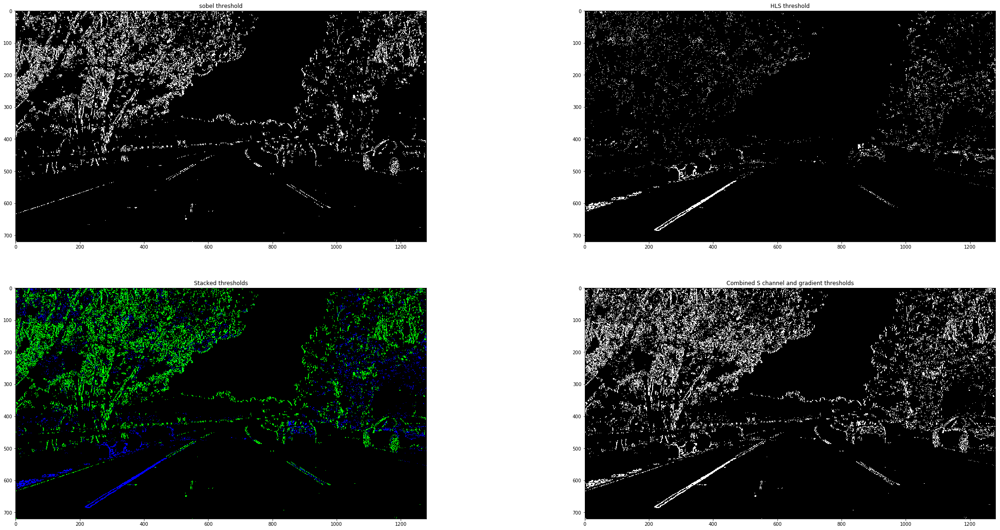

In [76]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# visualize HLS and sobel gradient separately

img = mpimg.imread('../test_images/test5.jpg')

# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
s_channel = hls[:,:,2]

# Grayscale image
# NOTE: we already saw that standard grayscaling lost color information for the lane lines
# Explore gradients in other colors spaces / color channels to see what might work better
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 30#20
thresh_max = 100#100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Threshold color channel
s_thresh_min = 170#170
s_thresh_max = 220#255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

# Plotting thresholded images
f, axs = plt.subplots(2, 2, figsize=(40,20))
axs[0, 0].set_title('sobel threshold')
axs[0, 0].imshow(sxbinary, cmap='gray')

axs[0, 1].set_title('HLS threshold')
axs[0, 1].imshow(s_binary, cmap='gray')

axs[1, 0].set_title('Stacked thresholds')
axs[1, 0].imshow(color_binary)

axs[1, 1].set_title('Combined S channel and gradient thresholds')
axs[1, 1].imshow(combined_binary, cmap='gray')

In [77]:
def apply_thresholds(img, sobel_thresholds=(thresh_min, thresh_max), hls_thresholds=(s_thresh_min, s_thresh_max)):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min , thresh_max = sobel_thresholds
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min, s_thresh_max = hls_thresholds
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

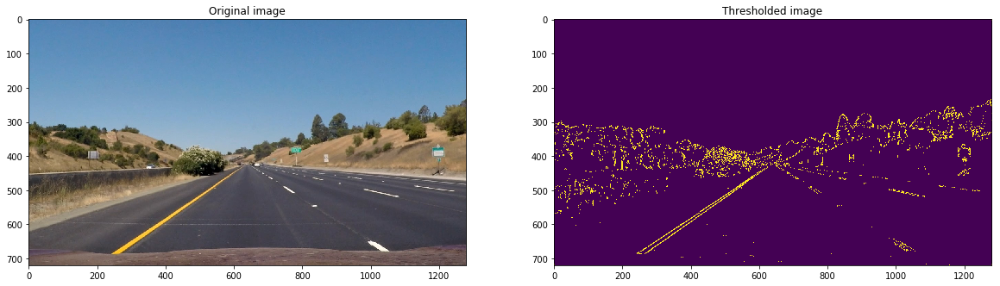

In [78]:
# visualize threshold image
img = mpimg.imread('../test_images/straight_lines1.jpg')
thresholded_img = apply_thresholds(img)

display_transform(img, thresholded_img, transform_text='Thresholded image')

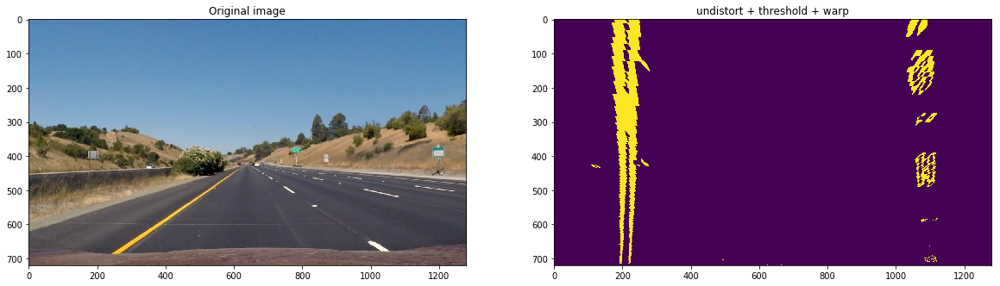

In [79]:
# visualize undistort, threshold + warp
transformed = warp(apply_thresholds(cal_undistort(img)))
display_transform(img, transformed, transform_text='undistort + threshold + warp')

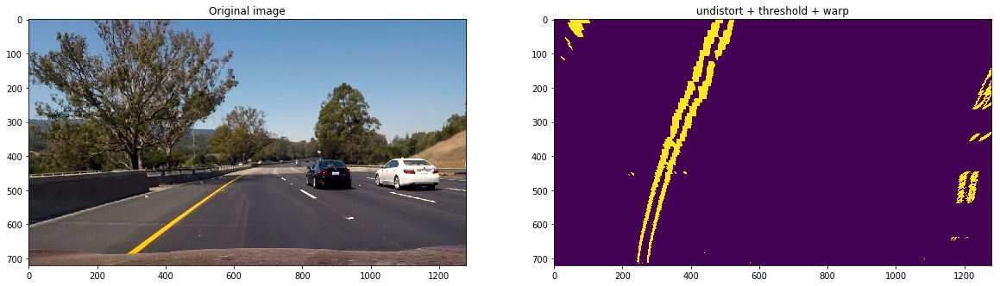

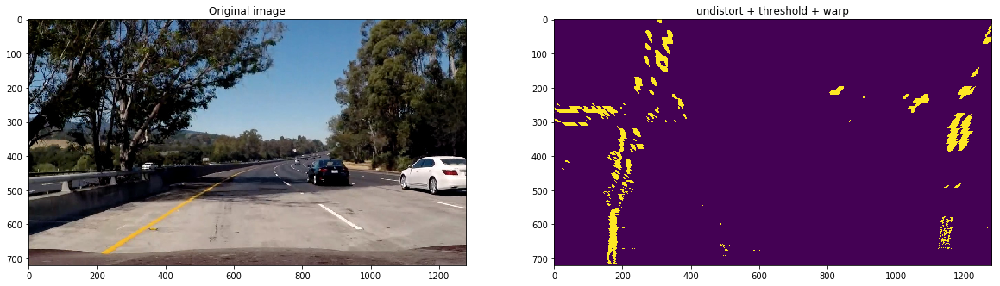

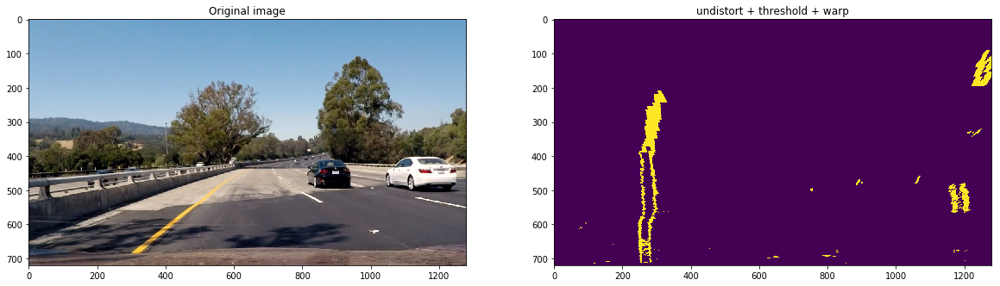

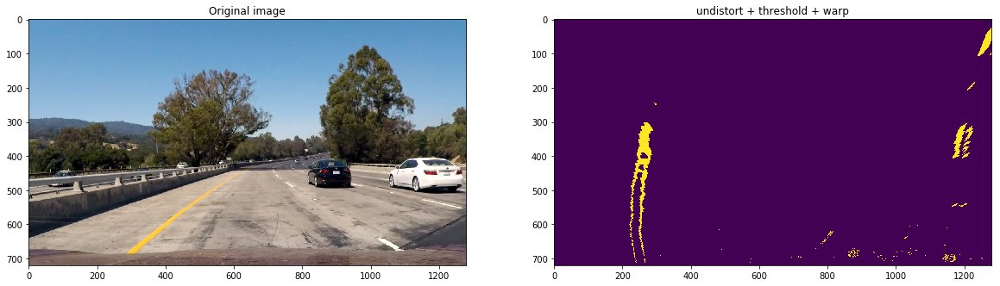

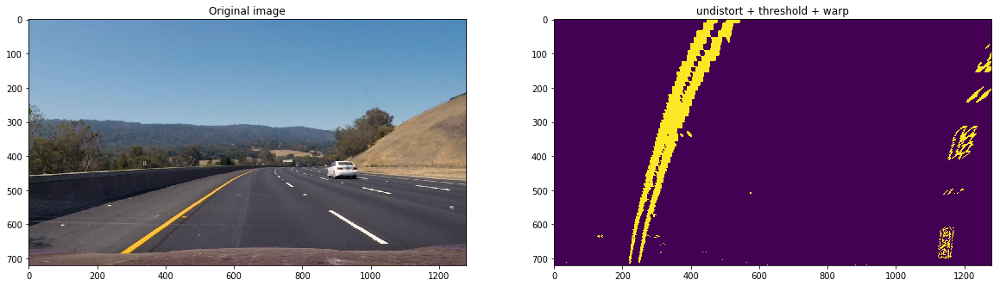

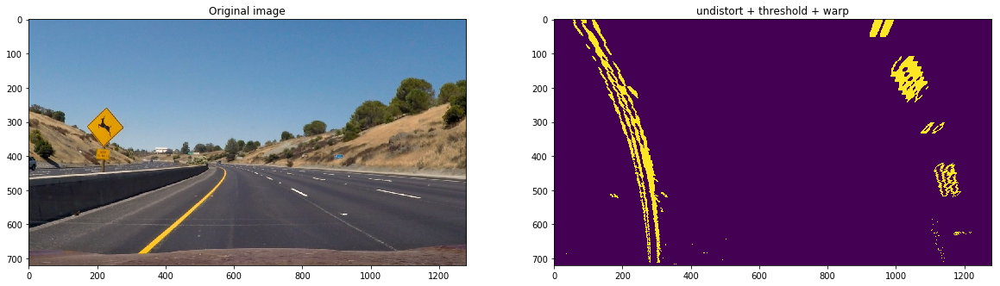

In [80]:
# Visualize undistort, threshold + warp for all test images

# Read in and make a list of test images
images = glob.glob('../test_images/test*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    out_img = warp(apply_thresholds((cal_undistort(img))))
    display_transform(img, out_img, transform_text='undistort + threshold + warp')

#### Sliding Windows

In [138]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit, display=False):
    ''' get lane lines by searching from prior
    '''
    # placeholder for optional output image
    out_img = None
    
    # The width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    if display is True:
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return leftx, lefty, rightx, righty, out_img

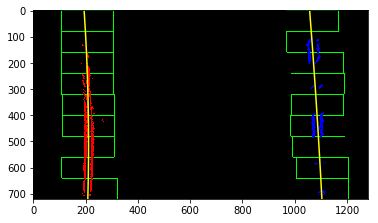

In [141]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2

# Load our image
img = mpimg.imread('../test_images/straight_lines1.jpg')
binary_warped = apply_thresholds(warp(img))

def find_lane_pixels(binary_warped, display=False):
    ''' get lane lines from scratch 
    '''
    # placeholder for optional output image
    out_img = None
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    if display is True:
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
 
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if display is True:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

# fit polynomial for visualization
def fit_polynomial(binary_warped, prior_left_fit=None, prior_right_fit=None, display=False):
    # Find our lane pixels first
    if prior_left_fit is None and prior_right_fit is None:
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, display=display)
    else:
        leftx, lefty, rightx, righty, out_img = search_around_poly(binary_warped, prior_left_fit, prior_right_fit, display=display)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    if display is True:
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        ## Visualization ##
        if display is True:
        # Colors in the left and right lane regions
            out_img[lefty, leftx] = [255, 0, 0]
            out_img[righty, rightx] = [0, 0, 255]

            # Plots the left and right polynomials on the lane lines
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')

    return ploty, left_fit, right_fit, out_img

def fit_polynomial_real(binary_warped, ym_per_pix, xm_per_pix):
    # Find lane pixels
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    # Fit a second order polynomial to each using 'np.polyfit'
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return left_fit_m, right_fit_m

ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped, display=True)

plt.imshow(out_img)

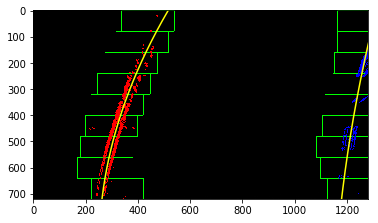

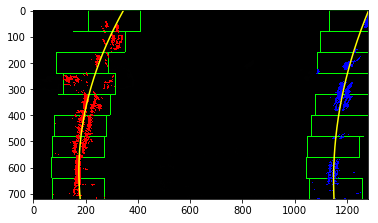

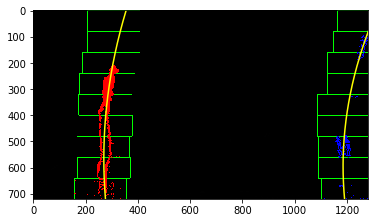

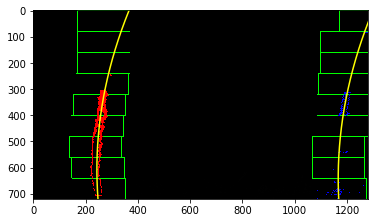

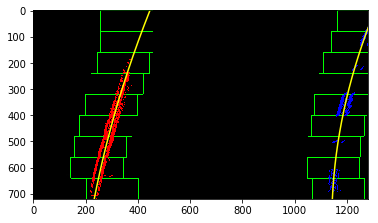

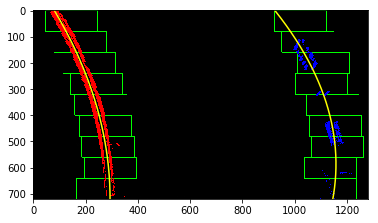

In [142]:
# Get polynomial fitting for all test images

# Read in and make a list of test images
images = glob.glob('../test_images/test*.jpg')

for fname in images:
    f = plt.figure()
    img = mpimg.imread(fname)
    binary_warped = apply_thresholds(warp(img))
    _, _, _, out_img = fit_polynomial(binary_warped, display=True)
    plt.imshow(out_img)

In [143]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

In [144]:
import numpy as np
    
def measure_curvature_real(ploty, left_fit_cr, right_fit_cr):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

left_fit_cr, right_fit_cr = fit_polynomial_real(binary_warped, xm_per_pix, ym_per_pix)

# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real(ploty, left_fit_cr, right_fit_cr)

print(left_curverad, 'm', right_curverad, 'm')

26940.9510192 m 79061.4107152 m


In [145]:
def project_lines(image, binary_warped, left_fit, right_fit):
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((binary_warped, binary_warped, binary_warped))
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    _, Minv = get_warped_perspective()

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    return result

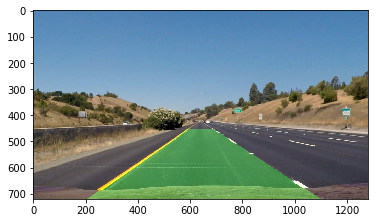

In [146]:
img = mpimg.imread('../test_images/straight_lines1.jpg')
binary_warped = apply_thresholds(warp(cal_undistort(img)))
ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped)
result = project_lines(img, binary_warped, left_fit, right_fit)
plt.imshow(result)

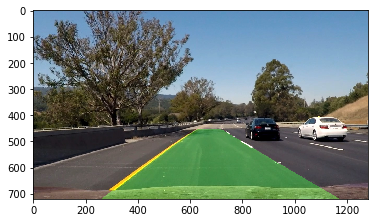

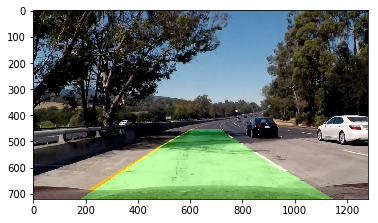

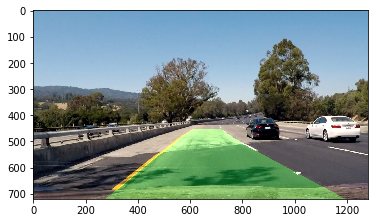

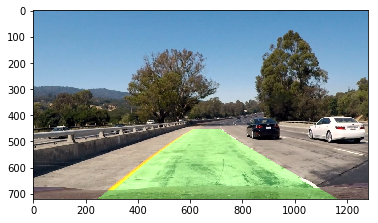

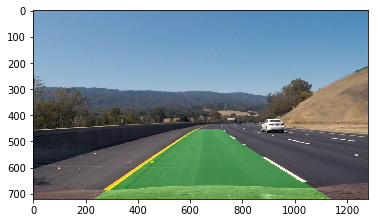

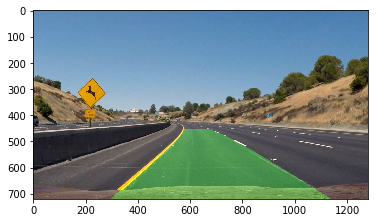

In [147]:
# Get polynomial fitting for all test images

# Read in and make a list of test images
images = glob.glob('../test_images/test*.jpg')

for fname in images:
    f = plt.figure()
    img = mpimg.imread(fname)
    binary_warped = apply_thresholds(warp(cal_undistort(img)))
    ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped)
    plt.imshow(project_lines(img, binary_warped, left_fit, right_fit))

In [148]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import os

if not os.path.isdir('test_videos_output'):
    os.mkdir('test_videos_output')

In [149]:
def process_image(image):
    binary_warped = apply_thresholds(warp(cal_undistort(image)))
    ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped)
    return project_lines(image, binary_warped, left_fit, right_fit)
    

In [152]:
white_output = 'test.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../project_video.mp4")
line = Line()
white_clip = clip1.fl_image(line.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test.mp4
[MoviePy] Writing video test.mp4








  0%|          | 0/1261 [00:00<?, ?it/s]





  0%|          | 1/1261 [00:01<41:43,  1.99s/it]





  0%|          | 2/1261 [00:03<41:31,  1.98s/it]





  0%|          | 3/1261 [00:05<39:40,  1.89s/it]





  0%|          | 4/1261 [00:07<38:12,  1.82s/it]





  0%|          | 5/1261 [00:08<37:11,  1.78s/it]





  0%|          | 6/1261 [00:10<36:19,  1.74s/it]





  1%|          | 7/1261 [00:11<35:39,  1.71s/it]





  1%|          | 8/1261 [00:13<35:07,  1.68s/it]





  1%|          | 9/1261 [00:15<34:47,  1.67s/it]





  1%|          | 10/1261 [00:16<34:42,  1.66s/it]





  1%|          | 11/1261 [00:18<34:40,  1.66s/it]

KeyboardInterrupt: 

In [151]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        self.prior_left_fit = None
        self.prior_right_fit = None
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None 
    def process_image(self, image):
        binary_warped = apply_thresholds(warp(cal_undistort(image)))
        ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped, self.prior_left_fit, self.prior_right_fit)
        self.prior_left_fit = left_fit
        self.prior_right_fit = right_fit
        return project_lines(image, binary_warped, left_fit, right_fit)
        
        
    def test(self):
        return 1

In [111]:
line = Line()

In [112]:
line.test()

1

False